In [ ]:
import os
import torchvision
from torch.utils.data import DataLoader, random_split
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.optim as optim
import torchvision.transforms.functional as TF
import torch
from scipy.optimize import linear_sum_assignment
from torchvision.ops import box_convert
from PIL import Image, ImageDraw
from torchvision.datasets import VOCDetection
from torch.utils.data import DataLoader, Subset
import numpy as np
from tqdm import tqdm
from torchvision.ops import box_iou
import random
import matplotlib.patches as patches
from torchvision.ops import box_iou
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.transforms.functional import to_pil_image

In [ ]:
data_dir = './data/pascal_voc'
os.makedirs(data_dir, exist_ok=True)

In [ ]:
voc_trainval = VOCDetection(root=data_dir, year='2007', image_set='trainval', download=True)
voc_test = VOCDetection(root=data_dir, year='2007', image_set='test', download=True)

100%|██████████| 460M/460M [00:11<00:00, 38.8MB/s]
100%|██████████| 451M/451M [00:14<00:00, 30.1MB/s]


In [ ]:
total_len = len(voc_trainval)
train_len = int(0.8 * total_len)
indices = torch.randperm(total_len).tolist()
train_indices = indices[:train_len]
val_indices = indices[train_len:]

voc_train = Subset(voc_trainval, train_indices)
voc_val = Subset(voc_trainval, val_indices)

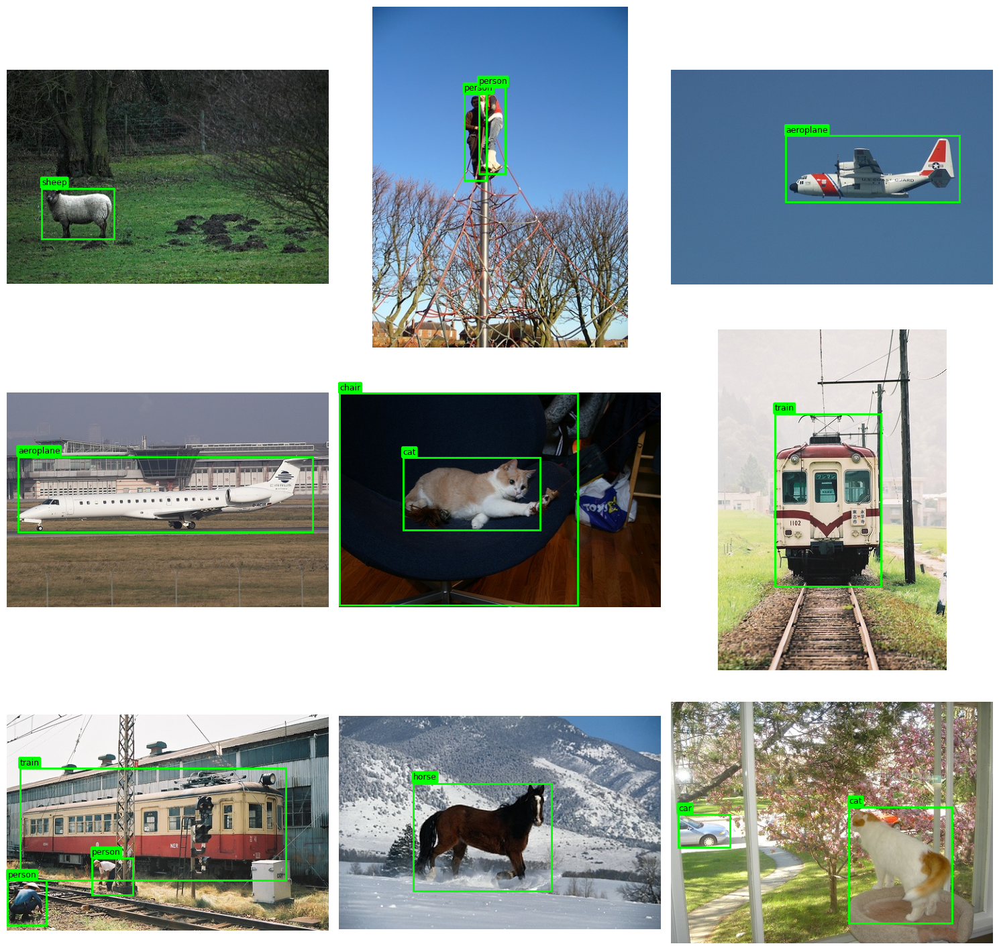

In [ ]:
def plot_voc_images(dataset, num_images=9):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    indices = random.sample(range(len(dataset)), num_images)

    for i, idx in enumerate(indices):
        image, target = dataset[idx]

        ax = axes[i // 3, i % 3]
        ax.imshow(image)

        objects = target['annotation']['object']
        if not isinstance(objects, list):
            objects = [objects]

        for obj in objects:
            bbox = obj['bndbox']
            label = obj['name']

            xmin = int(bbox['xmin'])
            ymin = int(bbox['ymin'])
            xmax = int(bbox['xmax'])
            ymax = int(bbox['ymax'])

            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, label, fontsize=9, color='black',
                    bbox=dict(facecolor='lime', edgecolor='none', boxstyle='round,pad=0.2'))

        ax.axis('off')

    plt.tight_layout()
    plt.show()

plot_voc_images(voc_train)


In [ ]:
label_map = {
    "aeroplane": 0, "bicycle": 1, "bird": 2, "boat": 3, "bottle": 4,
    "bus": 5, "car": 6, "cat": 7, "chair": 8, "cow": 9,
    "diningtable": 10, "dog": 11, "horse": 12, "motorbike": 13, "person": 14,
    "pottedplant": 15, "sheep": 16, "sofa": 17, "train": 18, "tvmonitor": 19
}


In [ ]:
def parse_voc_annotation(annotation):
    """Convert VOC annotation to DETR format targets"""
    boxes = []
    labels = []

    for obj in annotation['annotation']['object']:
        bbox = obj['bndbox']
        xmin = float(bbox['xmin'])
        ymin = float(bbox['ymin'])
        xmax = float(bbox['xmax'])
        ymax = float(bbox['ymax'])

        width = xmax - xmin
        height = ymax - ymin
        x_center = xmin + width / 2
        y_center = ymin + height / 2

        boxes.append([x_center, y_center, width, height])
        labels.append(label_map[obj['name']])

    return {
        'boxes': torch.tensor(boxes, dtype=torch.float32),
        'labels': torch.tensor(labels, dtype=torch.int64)
    }

In [ ]:
class VOCDatasetForDETR(torch.utils.data.Dataset):
    def __init__(self, voc_dataset, transform=None):
        self.voc_dataset = voc_dataset
        self.transform = transform

    def __len__(self):
        return len(self.voc_dataset)

    def __getitem__(self, idx):
        img, annotation = self.voc_dataset[idx]
        orig_width, orig_height = img.size

        target = parse_voc_annotation(annotation)

        if len(target['boxes']) > 0:
            target['boxes'][:, 0] /= orig_width   # x_center
            target['boxes'][:, 1] /= orig_height  # y_center
            target['boxes'][:, 2] /= orig_width   # width
            target['boxes'][:, 3] /= orig_height  # height

        if self.transform:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img)

        return img, target

In [ ]:
data_transform = transforms.Compose([
    transforms.Resize((800, 800)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
train_dataset = VOCDatasetForDETR(voc_train, transform=data_transform)
val_dataset = VOCDatasetForDETR(voc_val, transform=data_transform)
test_dataset = VOCDatasetForDETR(voc_test, transform=data_transform)

In [ ]:
def plot_voc_images(dataset, label_map, num_images=9):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    indices = random.sample(range(len(dataset)), num_images)

    for i, idx in enumerate(indices):
        image, target = dataset[idx]

        image = image.permute(1, 2, 0).numpy()

        image = np.clip(image, 0, 1)

        ax = axes[i // 3, i % 3]
        ax.imshow(image)

        boxes = target['boxes']
        labels = target['labels']

        for box_idx in range(len(boxes)):
            # Get box coordinates
            xmin = int(boxes[box_idx][0] * image.shape[1])  # x_center
            ymin = int(boxes[box_idx][1] * image.shape[0])  # y_center
            width = int(boxes[box_idx][2] * image.shape[1])  # width
            height = int(boxes[box_idx][3] * image.shape[0])  # height

            xmin = int(xmin - width / 2)
            ymin = int(ymin - height / 2)

            rect = patches.Rectangle((xmin, ymin), width, height,
                                     linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)

            label = list(label_map.keys())[list(label_map.values()).index(int(labels[box_idx]))]

            ax.text(xmin, ymin - 5, label, fontsize=9, color='black',
                    bbox=dict(facecolor='lime', edgecolor='none', boxstyle='round,pad=0.2'))

        ax.axis('off')

    plt.tight_layout()
    plt.show()

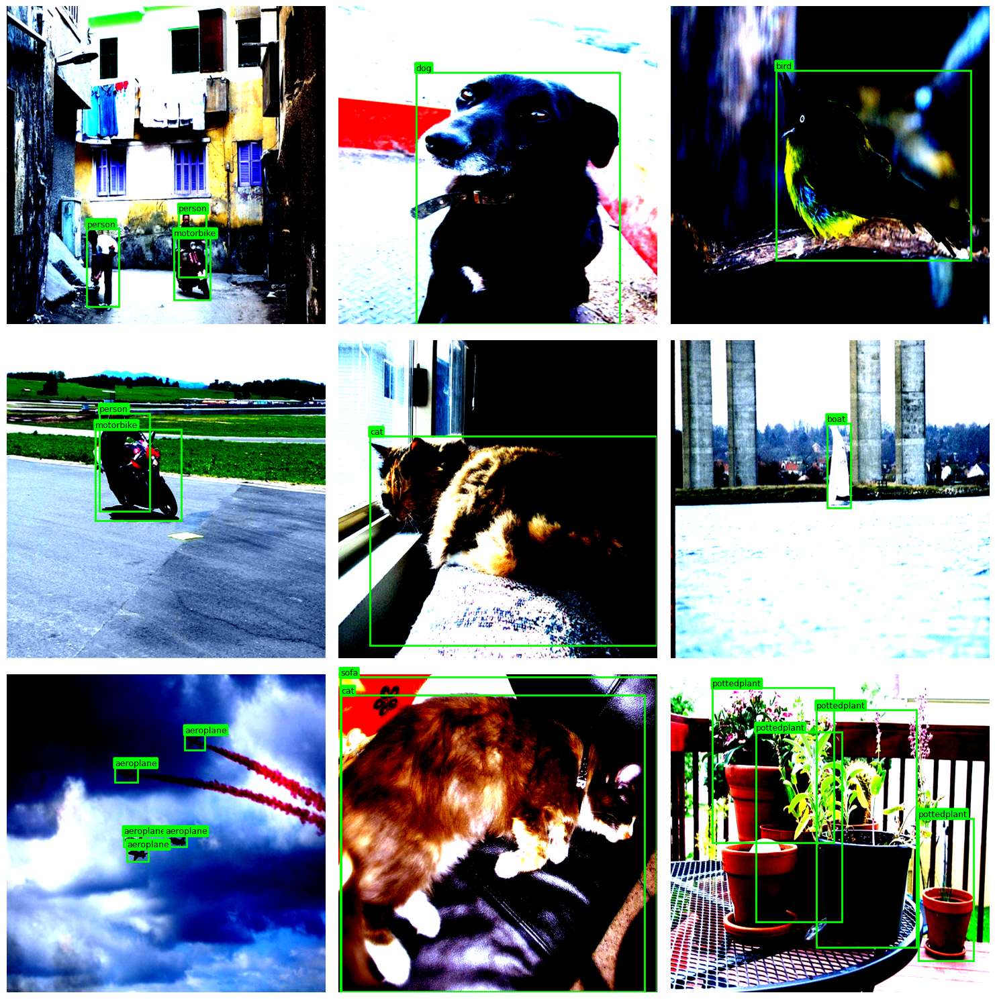

In [ ]:
plot_voc_images(train_dataset,label_map,num_images=9)

In [ ]:
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=lambda batch: tuple(zip(*batch)))
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=lambda batch: tuple(zip(*batch)))
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=lambda batch: tuple(zip(*batch)))

In [ ]:
print(f"Total training samples: {len(train_dataset)}")
print(f"Total validation samples: {len(val_dataset)}")
print(f"Total test samples: {len(test_dataset)}")

Total training samples: 4008
Total validation samples: 1003
Total test samples: 4952


In [ ]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-torch.log(torch.tensor(10000.0)) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

class DETRResNet50(nn.Module):
    def __init__(self, num_classes, num_queries=100, hidden_dim=256):
        super(DETRResNet50, self).__init__()
        self.num_classes = num_classes
        self.num_queries = num_queries

        # ResNet50 backbone
        backbone = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
        self.backbone = nn.Sequential(*list(backbone.children())[:-2])  # Remove avg pool and fc

        # Projection layer from backbone to transformer dimensions
        self.conv = nn.Conv2d(2048, hidden_dim, 1)

        # Positional encoding
        self.position_embedding = PositionalEncoding(hidden_dim)

        # Transformer
        encoder_layer = nn.TransformerEncoderLayer(d_model=hidden_dim, nhead=8)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=6)

        decoder_layer = nn.TransformerDecoderLayer(d_model=hidden_dim, nhead=8)
        self.transformer_decoder = nn.TransformerDecoder(decoder_layer, num_layers=6)

        # Object queries
        self.query_embed = nn.Embedding(num_queries, hidden_dim)

        # Output heads
        self.class_embed = nn.Linear(hidden_dim, num_classes + 1)  # +1 for background class
        self.bbox_embed = MLP(hidden_dim, hidden_dim, 4, 3)  # 4 box coordinates

    def forward(self, x):
        # Extract features from backbone
        features = self.backbone(x)

        # Project to transformer dimension
        h = self.conv(features)

        # Flatten spatial dimensions and permute to (HW, B, C)
        bs, c, h_dim, w_dim = h.shape
        h = h.flatten(2).permute(2, 0, 1)

        # Positional encoding
        h = self.position_embedding(h)

        # Transformer encoder
        memory = self.transformer_encoder(h)

        # Prepare object queries
        tgt = self.query_embed.weight.unsqueeze(1).repeat(1, bs, 1)

        # Transformer decoder
        hs = self.transformer_decoder(tgt, memory)

        # Output heads
        outputs_class = self.class_embed(hs)
        outputs_coord = self.bbox_embed(hs).sigmoid()  # Sigmoid to normalize to [0, 1]

        return outputs_class, outputs_coord

class MLP(nn.Module):
    """ Simple multi-layer perceptron """
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers):
        super().__init__()
        self.num_layers = num_layers
        h = [hidden_dim] * (num_layers - 1)
        self.layers = nn.ModuleList(
            nn.Linear(n, k) for n, k in zip([input_dim] + h, h + [output_dim])
        )

    def forward(self, x):
        for i, layer in enumerate(self.layers):
            x = F.relu(layer(x)) if i < self.num_layers - 1 else layer(x)
        return x

In [ ]:
num_classes = 20
model_resnet50 = DETRResNet50(num_classes=num_classes)

In [ ]:
def compute_loss(outputs, targets, class_cost=1.0, bbox_cost=5.0):
    outputs_class, outputs_bbox = outputs
    bs = outputs_class.shape[1]
    total_cls_loss, total_bbox_loss = 0, 0

    for b in range(bs):
        pred_logits = outputs_class[:, b]
        pred_boxes = outputs_bbox[:, b]

        tgt_labels = targets[b]['labels']
        tgt_boxes = targets[b]['boxes']

        num_queries = pred_logits.shape[0]
        num_targets = tgt_labels.shape[0]

        if num_targets == 0:
            continue

        pred_probs = pred_logits.softmax(-1)
        cls_cost = -pred_probs[:, tgt_labels]

        # L1 bbox cost
        bbox_cost_matrix = torch.cdist(pred_boxes, tgt_boxes, p=1)

        cost_matrix = class_cost * cls_cost + bbox_cost * bbox_cost_matrix
        cost_matrix = cost_matrix.detach().cpu().numpy()

        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_pred_logits = pred_logits[row_ind]
        matched_pred_boxes = pred_boxes[row_ind]
        matched_tgt_labels = tgt_labels[col_ind]
        matched_tgt_boxes = tgt_boxes[col_ind]

        cls_loss = F.cross_entropy(matched_pred_logits, matched_tgt_labels)
        bbox_loss = F.l1_loss(matched_pred_boxes, matched_tgt_boxes)

        total_cls_loss += cls_loss
        total_bbox_loss += bbox_loss

    total_loss = total_cls_loss + total_bbox_loss
    return total_loss, total_cls_loss, total_bbox_loss

In [ ]:
def train_one_epoch(model, dataloader, optimizer, device):
    model.train()
    running_loss = 0.0
    for images, targets in tqdm(dataloader, desc='Training'):
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        images = torch.stack(images).to(device)
        optimizer.zero_grad()
        outputs = model(images)

        loss, cls_loss, bbox_loss = compute_loss(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    return running_loss / len(dataloader)

In [ ]:
def evaluate(model, dataloader, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in tqdm(dataloader, desc='Validation'):
            images = list(img.to(device) for img in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            images = torch.stack(images).to(device)
            outputs = model(images)

            loss, _, _ = compute_loss(outputs, targets)
            running_loss += loss.item()

    return running_loss / len(dataloader)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
model_resnet50.to(device)

optimizer = optim.AdamW(model_resnet50.parameters(), lr=1e-4, weight_decay=1e-4)

In [26]:
num_epochs = 10
best_val_loss = float('inf')

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch + 1}/{num_epochs}")

    train_loss = train_one_epoch(model_resnet50, train_loader, optimizer, device)
    val_loss = evaluate(model_resnet50, val_loader, device)

    print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model_resnet50.state_dict(), 'detr_resnet50_best.pth')
        print("✅ Saved best model!")


Epoch 1/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.05it/s]


Train Loss: 18.5927 | Val Loss: 15.2490
✅ Saved best model!

Epoch 2/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.05it/s]


Train Loss: 12.7384 | Val Loss: 11.6376
✅ Saved best model!

Epoch 3/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.04it/s]


Train Loss: 10.0246 | Val Loss: 11.1545
✅ Saved best model!

Epoch 4/10


Validation: 100%|██████████| 126/126 [01:02<00:00,  2.00it/s]


Train Loss: 8.5606 | Val Loss: 11.0417
✅ Saved best model!

Epoch 5/10


Validation: 100%|██████████| 126/126 [01:02<00:00,  2.00it/s]


Train Loss: 7.3753 | Val Loss: 9.2286
✅ Saved best model!

Epoch 6/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.04it/s]


Train Loss: 6.6817 | Val Loss: 10.1898

Epoch 7/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.06it/s]


Train Loss: 5.7905 | Val Loss: 9.6702

Epoch 8/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.06it/s]


Train Loss: 5.1462 | Val Loss: 9.4041

Epoch 9/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.05it/s]


Train Loss: 4.6544 | Val Loss: 8.8028
✅ Saved best model!

Epoch 10/10


Validation: 100%|██████████| 126/126 [01:01<00:00,  2.06it/s]

Train Loss: 4.8645 | Val Loss: 10.6802


In [ ]:
def visualize_predictions(model, dataset, device, label_map, num_images=5, score_threshold=0.1):
    model.eval()
    label_names = {v: k for k, v in label_map.items()}

    fig, axs = plt.subplots(nrows=num_images, figsize=(10, num_images * 5))

    for idx in range(num_images):
        img, target = dataset[idx]
        img_tensor = img.unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(img_tensor)

        pred_logits = outputs[0][:, 0, :]
        pred_boxes = outputs[1][:, 0, :]

        probs = pred_logits.softmax(-1)
        scores, labels = probs.max(-1)

        keep = (scores > score_threshold) & (labels != pred_logits.shape[-1] - 1)
        pred_boxes = pred_boxes[keep].cpu()
        labels = labels[keep].cpu()
        scores = scores[keep].cpu()

        img_np = img.cpu()
        if img_np.min() < 0:
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            img_np = img_np * std + mean

        img_np = torch.clamp(img_np, 0, 1)
        img_pil = TF.to_pil_image(img_np)

        ax = axs[idx] if num_images > 1 else axs
        ax.imshow(img_pil)
        ax.axis("off")

        for gt_box, gt_label in zip(target["boxes"], target["labels"]):
            gt_box = gt_box.cpu().numpy()
            x_center, y_center, w, h = gt_box
            xmin = x_center - w / 2
            ymin = y_center - h / 2
            rect = plt.Rectangle((xmin * img_pil.width, ymin * img_pil.height),
                                 w * img_pil.width, h * img_pil.height,
                                 fill=False, edgecolor='green', linewidth=2)
            ax.add_patch(rect)
            ax.text(xmin * img_pil.width, ymin * img_pil.height,
                    f"GT: {label_names[int(gt_label)]}",
                    color='green', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

        for box, label, score in zip(pred_boxes, labels, scores):
            box = box.numpy()
            x_center, y_center, w, h = box
            xmin = x_center - w / 2
            ymin = y_center - h / 2
            rect = plt.Rectangle((xmin * img_pil.width, ymin * img_pil.height),
                                 w * img_pil.width, h * img_pil.height,
                                 fill=False, edgecolor='red', linewidth=2)
            ax.add_patch(rect)
            ax.text(xmin * img_pil.width, ymin * img_pil.height,
                    f"Pred: {label_names[int(label)]} ({score:.2f})",
                    color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()

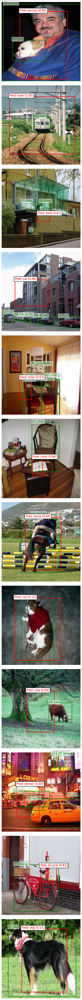

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
visualize_predictions(model_resnet50, test_dataset, device, label_map, num_images=12)

In [32]:
def box_cxcywh_to_xyxy(boxes):
    x_c, y_c, w, h = boxes.unbind(-1)
    return torch.stack([x_c - 0.5 * w, y_c - 0.5 * h,
                        x_c + 0.5 * w, y_c + 0.5 * h], dim=-1)

def compute_iou(pred_boxes, target_boxes):
    return box_iou(pred_boxes, target_boxes)

def match_predictions(pred_boxes, target_boxes, iou_threshold=0.5):
    iou = compute_iou(pred_boxes, target_boxes)
    matches = iou > iou_threshold
    true_positives = matches.sum(dim=1).clamp(max=1)
    return true_positives.sum().item(), len(pred_boxes), len(target_boxes)

def evaluate_metrics(model, dataloader, device, iou_threshold=0.5):
    model.eval()
    total_tp = 0
    total_pred = 0
    total_gt = 0
    all_precisions = []
    all_recalls = []

    with torch.no_grad():
        for images, targets in tqdm(dataloader, desc=f"Evaluating @ IoU {iou_threshold}"):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            images = torch.stack(images).to(device)

            outputs_class, outputs_boxes = model(images)
            bs = len(targets)

            for i in range(bs):
                probs = outputs_class[:, i].softmax(-1)
                scores, labels = probs.max(-1)
                boxes = outputs_boxes[:, i]

                keep = (labels != model.num_classes)
                boxes = boxes[keep]
                labels = labels[keep]
                scores = scores[keep]

                if boxes.shape[0] == 0:
                    continue

                boxes = box_cxcywh_to_xyxy(boxes)
                gt_boxes = box_cxcywh_to_xyxy(targets[i]['boxes'])

                tp, n_pred, n_gt = match_predictions(boxes, gt_boxes, iou_threshold)
                precision = tp / n_pred if n_pred > 0 else 0
                recall = tp / n_gt if n_gt > 0 else 0

                all_precisions.append(precision)
                all_recalls.append(recall)

                total_tp += tp
                total_pred += n_pred
                total_gt += n_gt

    avg_precision = np.mean(all_precisions)
    avg_recall = np.mean(all_recalls)
    f1_score = 2 * avg_precision * avg_recall / (avg_precision + avg_recall + 1e-8)

    print(f"\n Evaluation Metrics @ IoU {iou_threshold}")
    print(f"Precision: {avg_precision:.4f}")
    print(f"Recall:    {avg_recall:.4f}")
    print(f"F1-score:  {f1_score:.4f}")
    print(f"AP{int(iou_threshold * 100)}:      {avg_precision:.4f}")

    return avg_precision, avg_recall, f1_score

In [33]:
ap50, rec50, f1_50 = evaluate_metrics(model_resnet50, test_loader, device, iou_threshold=0.5)
ap75, rec75, f1_75 = evaluate_metrics(model_resnet50, test_loader, device, iou_threshold=0.75)

print("\n Summary")
print(f"AP50: {ap50:.4f}, AP75: {ap75:.4f}")

Evaluating @ IoU 0.5: 100%|██████████| 619/619 [05:10<00:00,  1.99it/s]



 Evaluation Metrics @ IoU 0.5
Precision: 0.2153
Recall:    14.0990
F1-score:  0.4242
AP50:      0.2153


Evaluating @ IoU 0.75: 100%|██████████| 619/619 [05:10<00:00,  1.99it/s]


 Evaluation Metrics @ IoU 0.75
Precision: 0.0123
Recall:    0.9246
F1-score:  0.0243
AP75:      0.0123

 Summary
AP50: 0.2153, AP75: 0.0123
